## <u>Data Wrangling</u>
> Import all required packages

In [178]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from scipy import stats
import missingno as msno
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

> Read the csv file into a dataframe

In [3]:
df = pd.read_csv('C:\\Users\\Hari\\Downloads\\aps_failure_training_set.csv',skiprows=20)

In [4]:
df.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0


> Replace the column names to more manageable numbers (as strings)

In [5]:
df.columns = ['class',*[str(x) for x in range(1,171)]]

In [6]:
df.head(1)

,class,1,2,3,4,5,6,7,8,9,...,161,162,163,164,165,166,167,168,169,170
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0


> Of the 171 columns, 'class' column is the target variable and the other 170 are predictors

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Columns: 171 entries, class to 170
dtypes: int64(1), object(170)
memory usage: 78.3+ MB


> Only column 1 is an integer. Other 170 are objects.

In [8]:
df.dtypes

class    object
1         int64
2        object
3        object
4        object
          ...  
166      object
167      object
168      object
169      object
170      object
Length: 171, dtype: object

> Missing values are encoded as string 'na'. Replace them with np.nan

In [9]:
df.replace('na',np.nan,inplace=True)

> Replace target columns' 'neg' and 'pos' with 0 and 1 respectively.

In [10]:
df['class'].replace({'neg':0,'pos':1},inplace=True)

> Convert all columns except 'class' to float.

In [11]:
df.iloc[:,1:] = df.iloc[:,1:].astype('float')

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Columns: 171 entries, class to 170
dtypes: float64(170), int64(1)
memory usage: 78.3 MB


In [13]:
df['class'].value_counts(dropna=False)

0    59000
1     1000
Name: class, dtype: int64

In [14]:
df.head()

,class,1,2,3,4,5,6,7,8,9,...,161,162,163,164,165,166,167,168,169,170
0,0,76698.0,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,0,33058.0,NaN,0.000000e+00,NaN,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,0,41040.0,NaN,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,0,12.0,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,0,60874.0,NaN,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0


In [58]:
profile = ProfileReport(df,explorative=True,minimal=True)

In [57]:
profile.to_notebook_iframe()

In [15]:
df.isna().mean().sort_values(ascending=False)[:10]

79     0.821067
78     0.812033
77     0.795667
76     0.772217
113    0.772150
2      0.772150
75     0.733483
74     0.659150
73     0.454617
72     0.383900
dtype: float64

In [16]:
df[df['class']==1].isna().mean().sort_values(ascending=False)[:20]

2      0.771
113    0.771
94     0.645
110    0.645
4      0.645
92     0.645
93     0.645
129    0.532
128    0.532
127    0.532
126    0.532
125    0.532
132    0.532
124    0.532
131    0.532
20     0.532
130    0.532
87     0.530
142    0.524
135    0.524
dtype: float64

In [17]:
df[df['class']==0].isna().mean().sort_values(ascending=False)[:20]

79     0.833458
78     0.824322
77     0.807746
76     0.783983
2      0.772169
113    0.772169
75     0.744661
74     0.669119
73     0.461186
72     0.389322
110    0.240949
93     0.240949
94     0.240949
4      0.240949
92     0.240949
124    0.225017
126    0.225017
127    0.225017
128    0.225017
129    0.225017
dtype: float64

In [18]:
df.shape

(60000, 171)

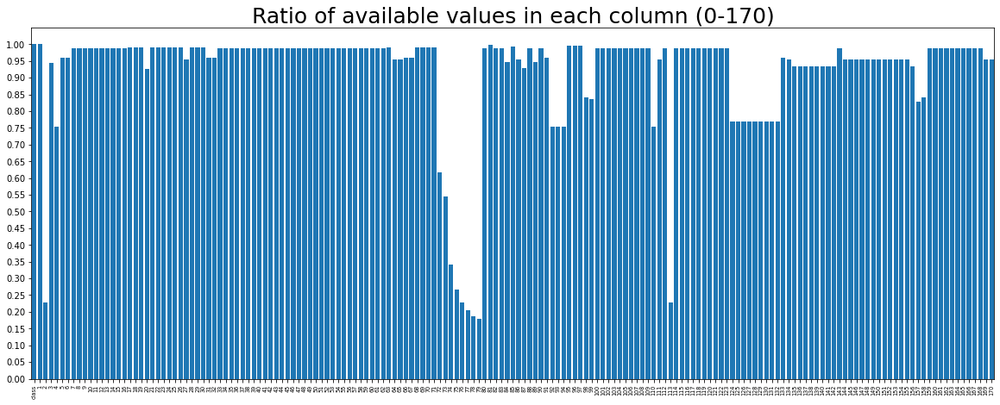

In [338]:
plt.figure(figsize=(20,7.5))
plt.bar(df.columns,1-df.isna().mean())
plt.xticks(rotation=90,fontsize=6.5)
plt.xlim(-0.5,len(df.columns)-.5)
plt.yticks(np.arange(0,1.05,0.05))
plt.title('Ratio of available values in each column (0-170)',fontsize=25);

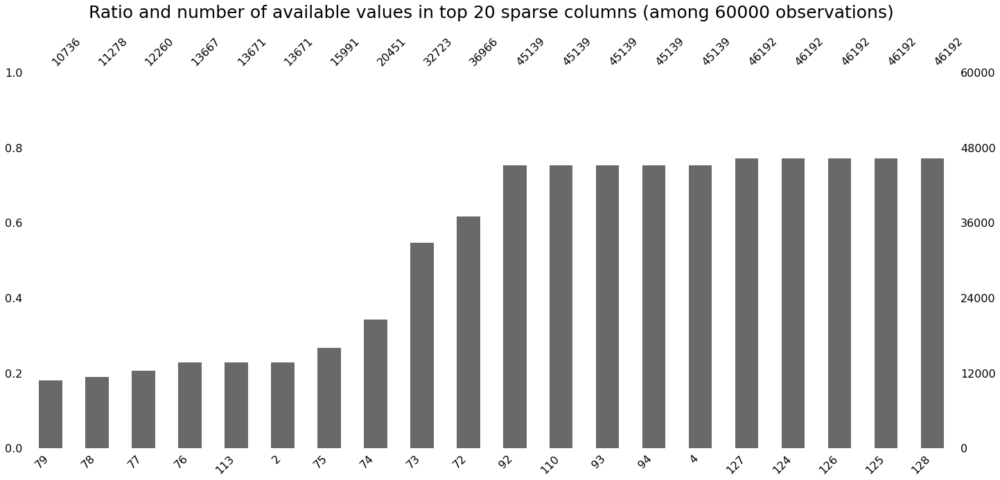

In [339]:
top20missing = df.isna().mean().sort_values(ascending=False)[:20].index
msno.bar(df[top20missing])
plt.title('Ratio and number of available values in top 20 sparse columns (among 60000 observations)',fontsize=25,pad=25);

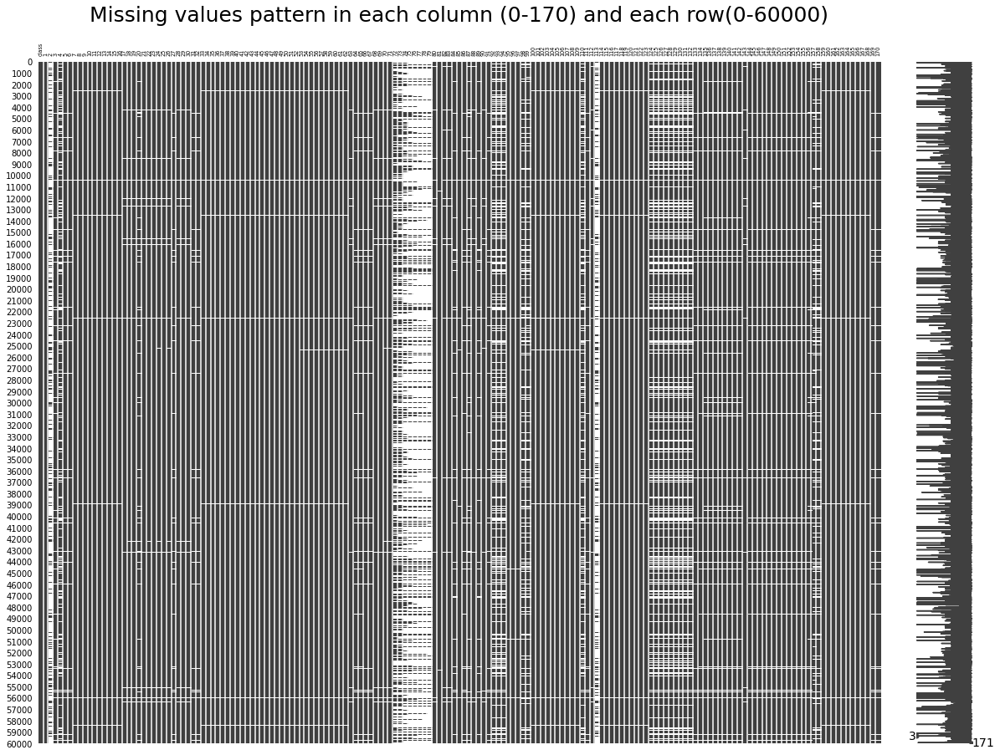

In [345]:
msno.matrix(df,figsize=(20,15))
plt.xticks(range(0,171),df.columns,rotation=90,fontsize=6.5)
plt.yticks(range(0,60001,1000),range(0,60001,1000),fontsize=10)
plt.title('Missing values pattern in each column (0-170) and each row(0-60000)',fontsize=25,pad=25);

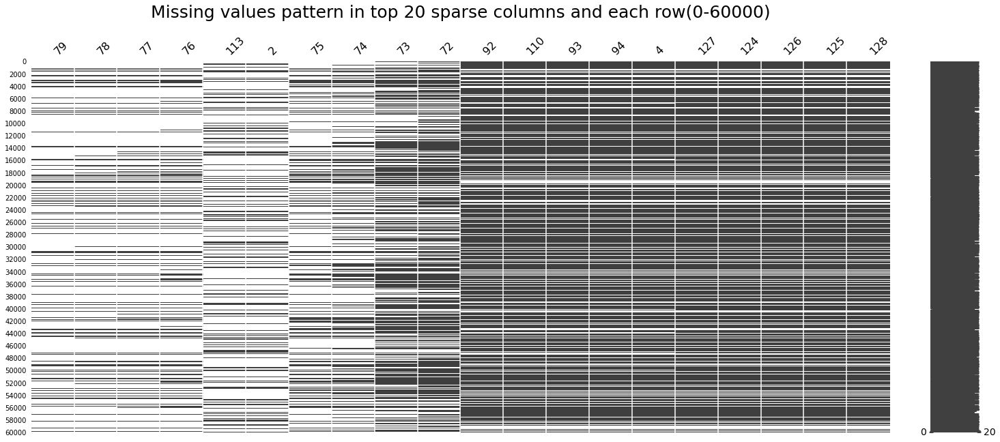

In [348]:
msno.matrix(df[top20missing])
plt.yticks(range(0,60001,2000),range(0,60001,2000),fontsize=10)
plt.title('Missing values pattern in top 20 sparse columns and each row(0-60000)',fontsize=25,pad=25);

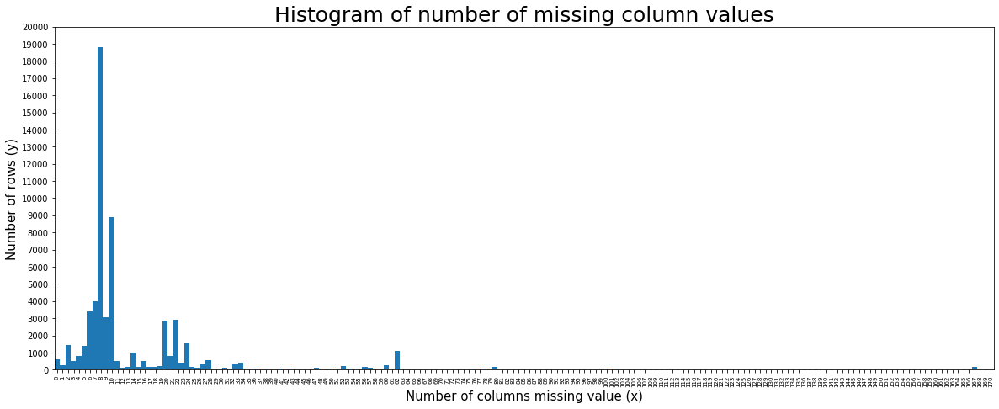

In [363]:
df.isna().sum(axis=1).hist(figsize=(20,7.5),bins=171,grid=False,align='left')
plt.title('Histogram of number of missing column values',fontsize=25)
plt.xlabel('Number of columns missing value (x)',size=15)
plt.ylabel('Number of rows (y)',size=15)
plt.yticks(range(0,20001,1000))
plt.xticks(range(0,171),rotation=90,fontsize=7)
plt.xlim(-0.5,len(df.columns)-.5);

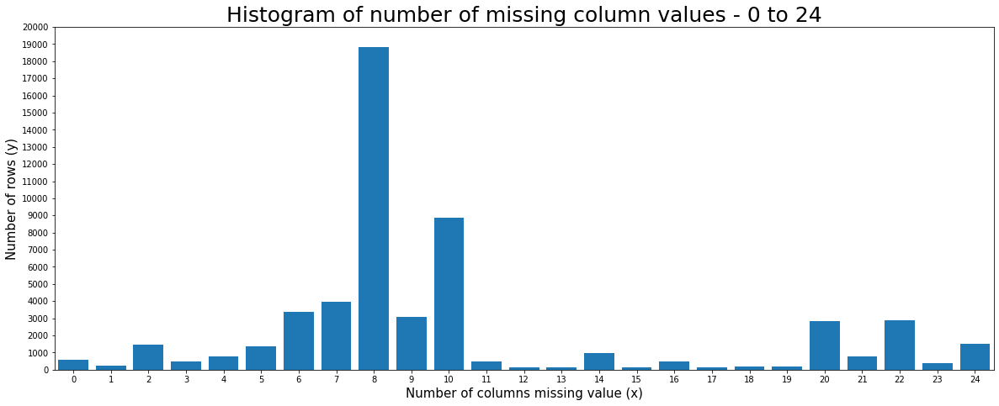

In [364]:
topmissingrows = df.isna().sum(axis=1).value_counts().sort_index()[:25]
plt.figure(figsize=(20,7.5))
plt.bar(topmissingrows.index.astype('str'),topmissingrows)
plt.title('Histogram of number of missing column values - 0 to 24',fontsize=25)
plt.xlabel('Number of columns missing value (x)',size=15)
plt.ylabel('Number of rows (y)',size=15)
plt.yticks(range(0,20001,1000))
plt.xlim(-0.5,len(topmissingrows.index)-.5);

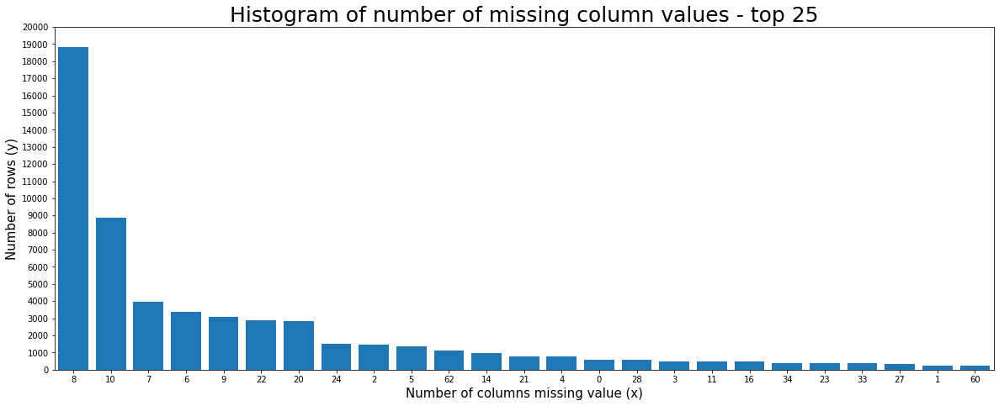

In [365]:
topmissingrows = df.isna().sum(axis=1).value_counts()[:25]
plt.figure(figsize=(20,7.5))
plt.bar(topmissingrows.index.astype('str'),topmissingrows)
plt.title('Histogram of number of missing column values - top 25',fontsize=25)
plt.xlabel('Number of columns missing value (x)',size=15)
plt.ylabel('Number of rows (y)',size=15)
plt.yticks(range(0,20001,1000))
plt.xlim(-0.5,len(topmissingrows.index)-.5);

In [366]:
df.isna().sum(axis=1).sort_values(ascending=False)

13028    168
28180    168
53885    168
3959     168
14255    168
        ... 
3481       0
10249      0
40780      0
49009      0
26962      0
Length: 60000, dtype: int64

In [367]:
df.loc[13028]

class         0.0
1        188324.0
2             NaN
3             NaN
4             NaN
           ...   
166           NaN
167           NaN
168           NaN
169           NaN
170           NaN
Name: 13028, Length: 171, dtype: float64

In [373]:
df['1'].isna().sum()

0

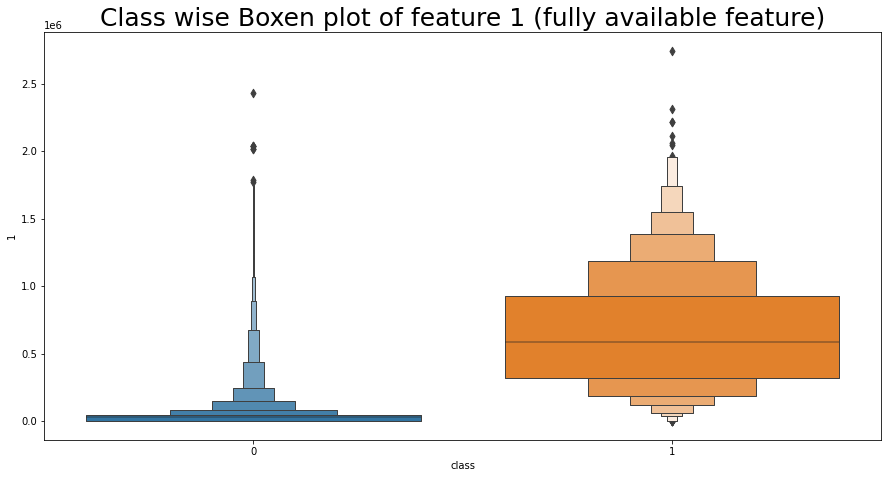

In [372]:
plt.figure(figsize=(15,7.5))
sns.boxenplot(y='1',x='class',data=df)
plt.title('Class wise Boxen plot of feature 1 (fully available feature)',fontsize=25);

In [374]:
df['1'].corr(df['class'])

0.5369783925131106

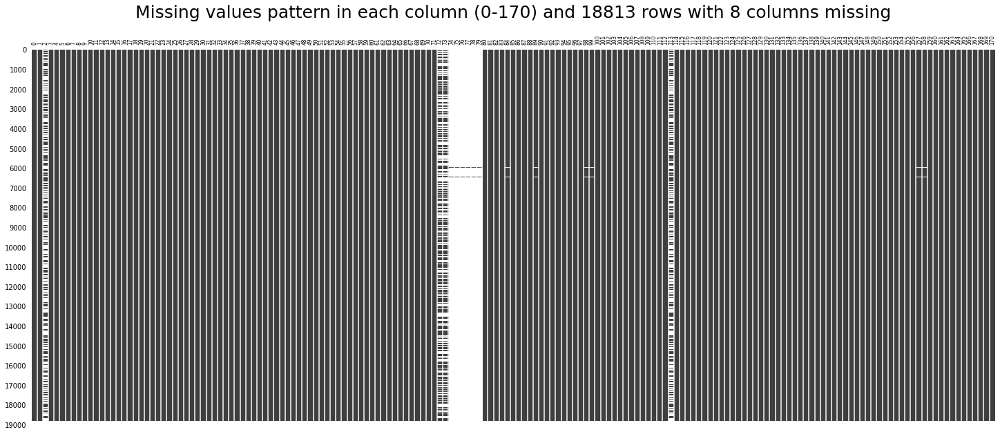

In [383]:
mask = df.isna().sum(axis=1)==8
msno.matrix(df[mask],sparkline=False)
plt.xticks(range(0,171),range(0,171),rotation=90,fontsize=7.5)
plt.yticks(range(0,20000,1000),range(0,20000,1000),fontsize=10)
plt.title('Missing values pattern in each column (0-170) and 18813 rows with 8 columns missing',fontsize=25,pad=25);

<AxesSubplot:>

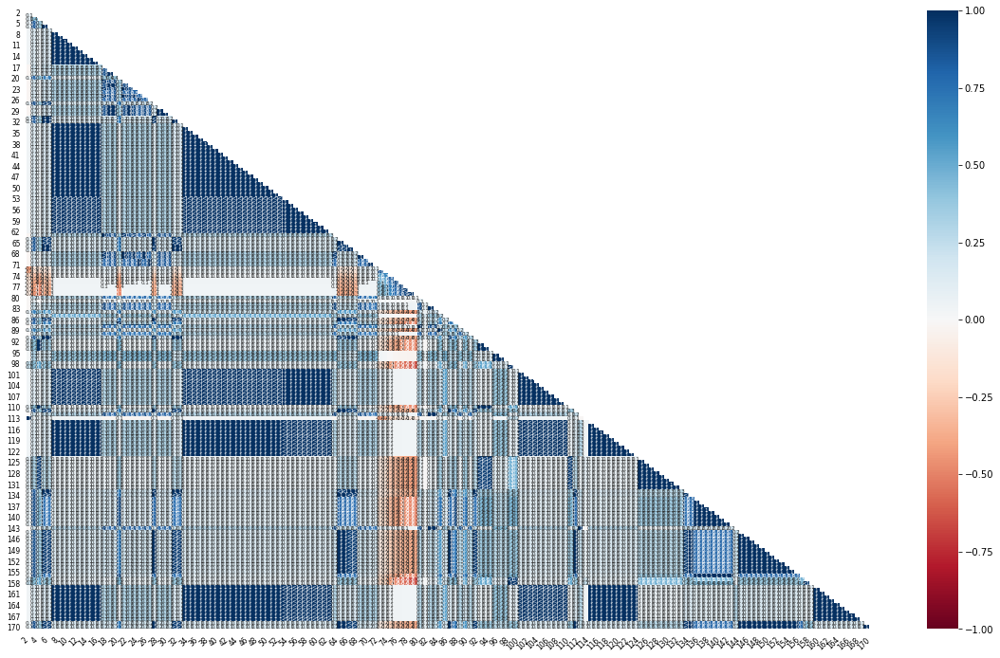

In [384]:
msno.heatmap(df,fontsize=7.5)

In [19]:
posmask = df['class']==1
negmask = df['class']==0

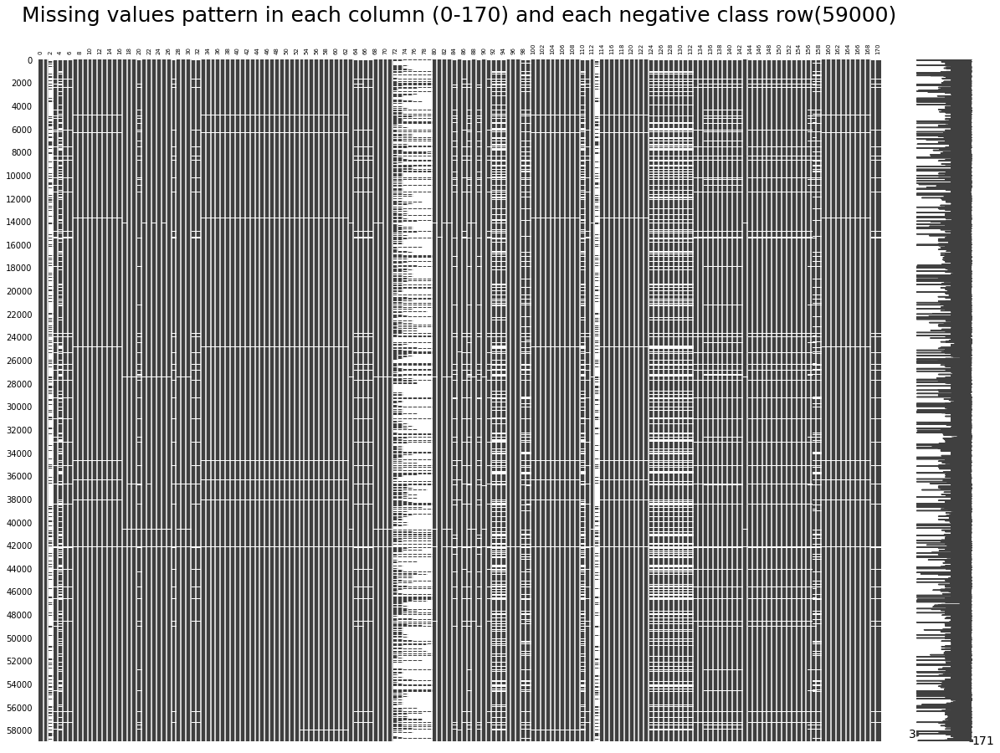

In [390]:
msno.matrix(df[negmask],figsize=(20,15))
plt.xticks(range(0,171,2),fontsize=7,rotation=90)
plt.yticks(range(0,59001,2000),range(0,59001,2000),fontsize=10)
plt.title('Missing values pattern in each column (0-170) and each negative class row(59000)',fontsize=25,pad=25);

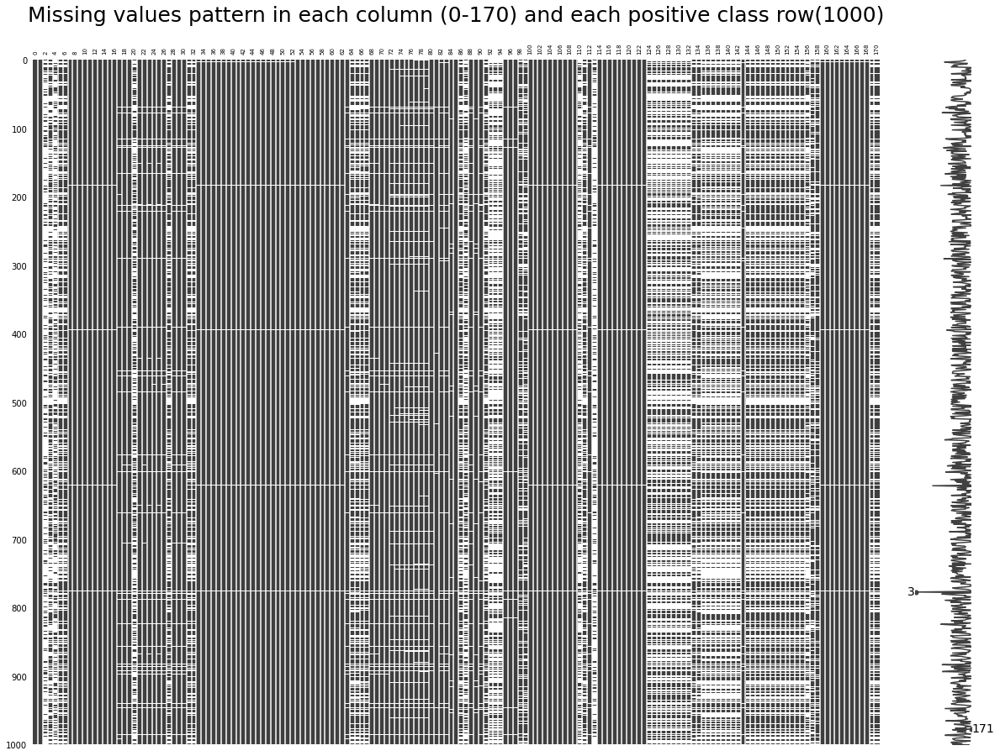

In [391]:
msno.matrix(df[posmask],figsize=(20,15))
plt.xticks(range(0,171,2),fontsize=7,rotation=90)
plt.yticks(range(0,1001,100),range(0,1001,100),fontsize=10)
plt.title('Missing values pattern in each column (0-170) and each positive class row(1000)',fontsize=25,pad=25);

In [392]:
df.head(1)

,class,1,2,3,4,5,6,7,8,9,...,161,162,163,164,165,166,167,168,169,170
0,0,76698.0,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0


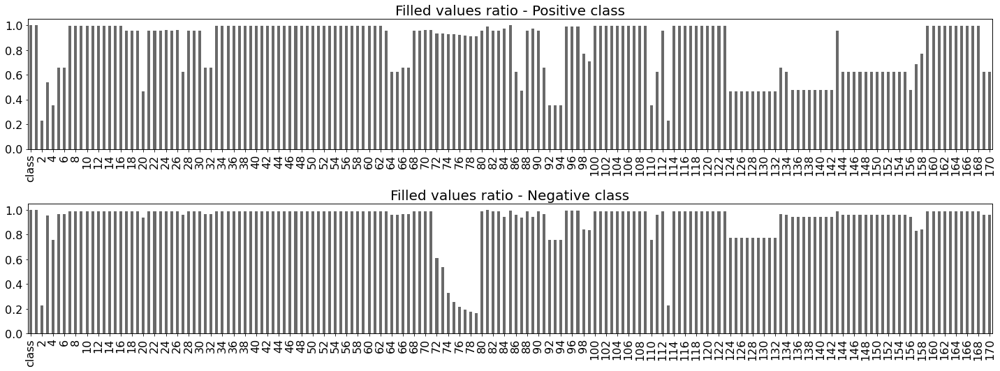

In [393]:
fig,axs = plt.subplots(2,1,figsize=(20,7.5))
try:
    msno.bar(df[posmask],ax=axs[0])
except:
    pass
axs[0].set_xticks(range(0,171,2))
axs[0].set_title('Filled values ratio - Positive class',fontsize=20)
try:
    msno.bar(df[negmask],ax=axs[1])
except:
    pass
axs[1].set_xticks(range(0,171,2))
axs[1].set_title('Filled values ratio - Negative class',fontsize=20)

plt.tight_layout()

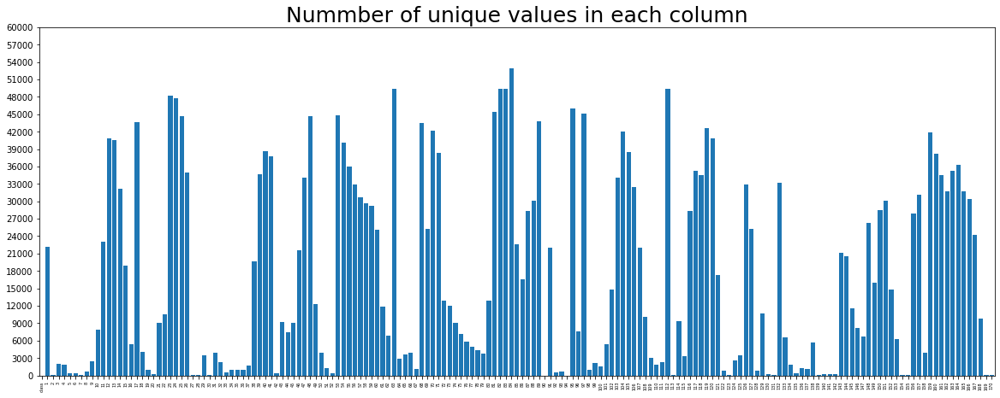

In [394]:
nunique = df.nunique()
plt.figure(figsize=(20,7.5))
plt.bar(nunique.index,nunique)
plt.title('Number of unique values in each column',fontsize=25)
plt.xticks(rotation=90,fontsize=5)
plt.xlim(-0.5,len(nunique)-.5)
plt.yticks(range(0,60001,3000));

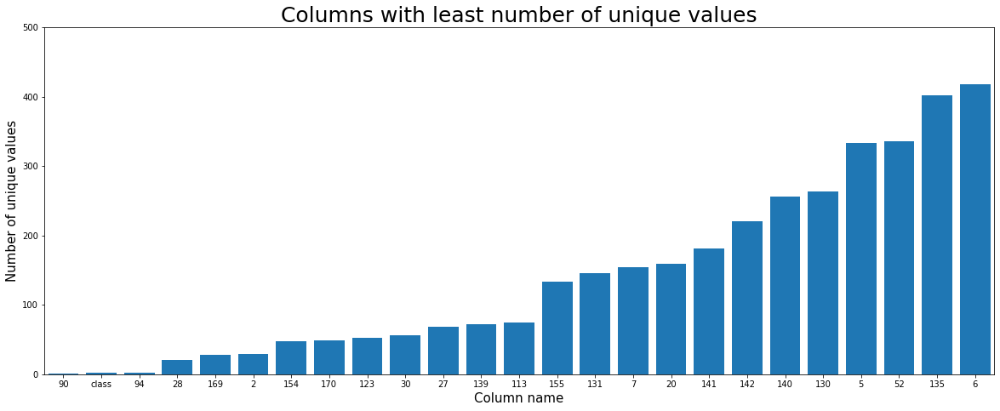

In [415]:
nunique = df.nunique().sort_values()[:25]
plt.figure(figsize=(20,7.5))
plt.bar(nunique.index,nunique)
plt.title('Columns with least number of unique values',fontsize=25)
plt.ylabel('Number of unique values',fontsize=15)
plt.xlabel('Column name',fontsize=15)
plt.xlim(-0.5,len(nunique)-.5)
plt.yticks(range(0,501,100));

<AxesSubplot:xlabel='class', ylabel='95'>

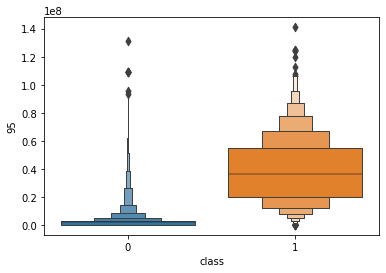

In [204]:
sns.boxenplot(x='class',y='95',data=df)

In [423]:
df['90'].value_counts(dropna=False,normalize=True)

1209600.0    0.988733
NaN          0.011267
Name: 90, dtype: float64

In [410]:
df[posmask]['90'].value_counts(dropna=False,normalize=True)

1209600.0    0.957
NaN          0.043
Name: 90, dtype: float64

In [411]:
df[negmask]['90'].value_counts(dropna=False,normalize=True)

1209600.0    0.989271
NaN          0.010729
Name: 90, dtype: float64

In [511]:
topmissingcols = pd.DataFrame()

for i in df.nunique().sort_values().index:
    a = round(df[i].value_counts(dropna=True,normalize=True),4)
    b = round(df[posmask][i].value_counts(dropna=True,normalize=True),4)
    c = round(df[negmask][i].value_counts(dropna=True,normalize=True),4)
    d = pd.DataFrame({'full':[(a.index[0],a.iloc[0])],'pos':[(b.index[0],b.iloc[0])],'neg':[(c.index[0],c.iloc[0])]},index=[i])
    if ((d['full'][0][1]>0.9) and (d['pos'][0][1]>0.9) and (d['neg'][0][1]>0.9)):
        topmissingcols = topmissingcols.append(d)

In [515]:
topmissingcols.drop('class',inplace=True)
topmissingcols

,full,pos,neg
90,"(1209600.0, 1.0)","(1209600.0, 1.0)","(1209600.0, 1.0)"
94,"(0.0, 0.9998)","(0.0, 0.9972)","(0.0, 0.9998)"
28,"(0.0, 0.9996)","(0.0, 0.9937)","(0.0, 0.9997)"
169,"(0.0, 0.9955)","(0.0, 0.9856)","(0.0, 0.9957)"
154,"(0.0, 0.9949)","(0.0, 0.9823)","(0.0, 0.995)"
170,"(0.0, 0.9916)","(0.0, 0.9823)","(0.0, 0.9917)"
123,"(0.0, 0.9511)","(0.0, 0.9478)","(0.0, 0.9511)"
30,"(0.0, 0.999)","(0.0, 0.9729)","(0.0, 0.9994)"
139,"(0.0, 0.9965)","(0.0, 0.9958)","(0.0, 0.9965)"
113,"(0.0, 0.9942)","(0.0, 0.9607)","(0.0, 0.9948)"


In [516]:
len(topmissingcols)

22

In [20]:
class_corr = df.corr()['class'][1:]

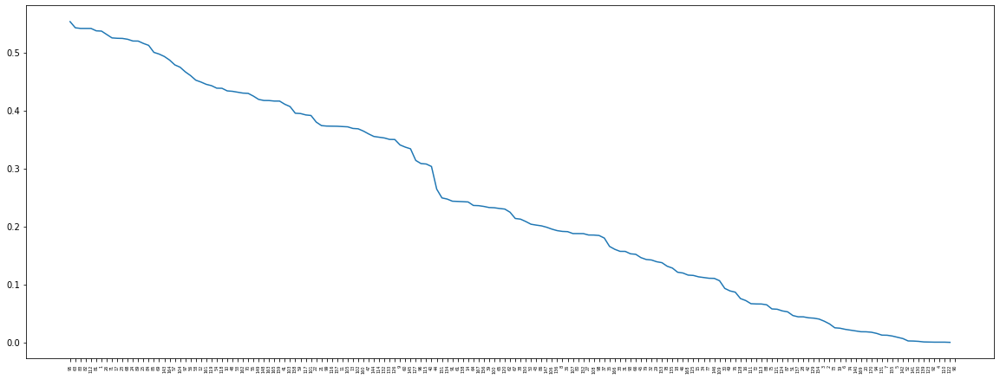

In [30]:
plt.figure(figsize=(20,7.5))
np.abs(class_corr).sort_values(ascending=False).plot()
plt.xticks(range(len(class_corr)),np.abs(class_corr).sort_values(ascending=False).index,rotation=90,fontsize=5);

In [272]:
np.abs(class_corr).sort_values(ascending=False)

95     0.553308
63     0.542744
83     0.541598
82     0.541598
112    0.541598
         ...   
92     0.000416
4      0.000415
110    0.000411
122    0.000091
90          NaN
Name: class, Length: 170, dtype: float64

In [34]:
np.abs(class_corr).sort_values(ascending=False)[np.abs(class_corr)>0.25].tail(10)

133    0.350163
126    0.349974
9      0.340611
60     0.336856
145    0.333959
127    0.313896
96     0.308464
115    0.307714
40     0.303490
44     0.264400
Name: class, dtype: float64

In [36]:
topcorrcols = np.abs(class_corr).sort_values(ascending=False)[np.abs(class_corr)>0.3].index

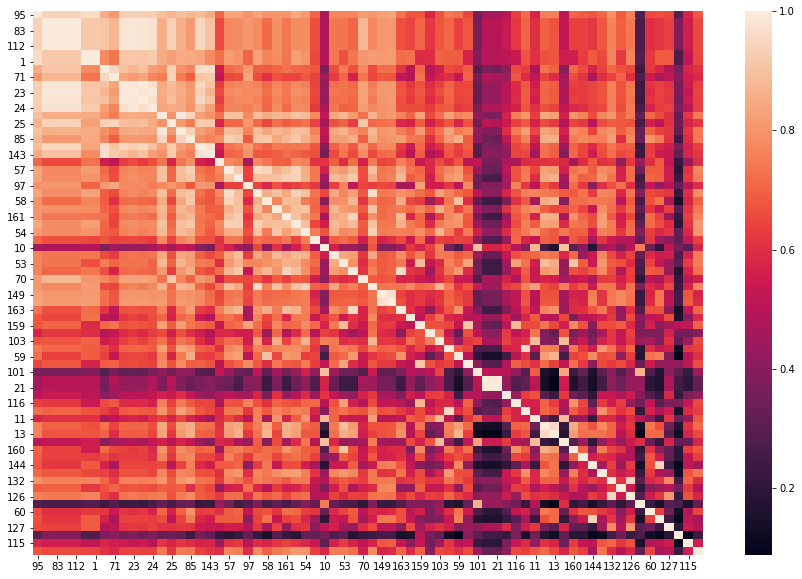

In [42]:
plt.figure(figsize=(15,10))
sns.heatmap(df[topcorrcols].corr());

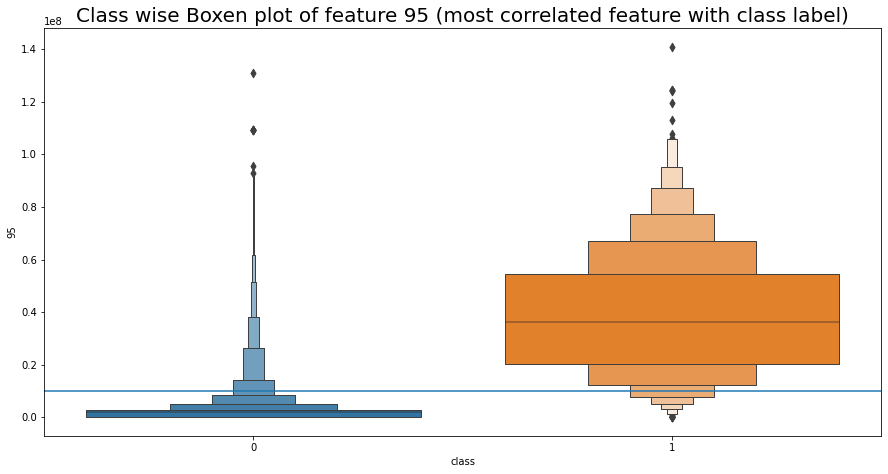

In [571]:
plt.figure(figsize=(15,7.5))
sns.boxenplot(y='95',x='class',data=df)
plt.title('Class wise Boxen plot of feature 95 (most correlated feature with class label)',fontsize=20)
plt.axhline(0.1*10**8);

In [233]:
(df['95']>0.8*10**8).sum()

77

In [238]:
(df[negmask]['95']>0.9*10**8).sum()

13

In [239]:
(df[posmask]['95']>0.9*10**8).sum()

23

In [600]:
df[negmask]['95'].quantile(0.25),df[posmask]['95'].quantile(0.003)

(45507.36000000001, 71218.29504)

best value of column '95': 9227248.779552253
least cost: 72780.0


<Figure size 1080x360 with 0 Axes>

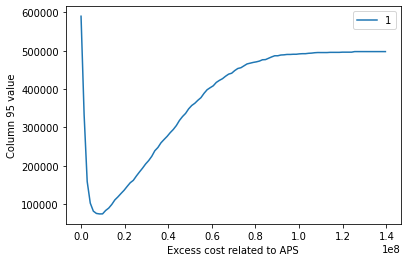

In [240]:
bv = (df['95'].max()+df['95'].min())/2
gap = np.abs(bv)
lc = 0
bestvalue = []
flag = 0
while(bv-gap != bv+gap):
    flag += 1
    for i in np.arange(bv-gap,bv+gap,(2*gap)/(100/flag**2)):
        temp=df['95'].copy()
        temp.values[:]=1
        temp[df[df['95']<i].index]=0
        cm = confusion_matrix(df['class'],temp)
        bestvalue.append((i,cm[0][1]*10+cm[1][0]*500))
    bestvaluedf = pd.DataFrame(bestvalue).set_index(0)
    bestvalue = []
    bv = float(bestvaluedf.idxmin().values)
    lc = float(bestvaluedf.min().values)
    gap = (np.abs(bv)*0.1)/flag**4
    if flag == 1:
        plt.figure(figsize=(15,5))
        bestvaluedf.plot()
        plt.xlabel('Excess cost related to APS')
        plt.ylabel('Column 95 value')   
    if ((bestvaluedf.max()/bestvaluedf.min()) < 1.001).values[0]:
        break
print('best value of column \'95\':',bv)
print('least cost:',lc);

In [241]:
test = pd.read_csv('C:\\Users\\Hari\\Downloads\\aps_failure_test_set.csv',skiprows=20)

In [250]:
test['ci_000'] = test['ci_000'].replace('na',np.nan).astype('float')

In [253]:
test['ci_000'].isna().sum()

86

In [258]:
test.columns = df.columns

In [268]:
test['class'] = test['class'].replace({'neg':0,'pos':1})

In [269]:
test.head(1)

,class,1,2,3,4,5,6,7,8,9,...,161,162,163,164,165,166,167,168,169,170
0,0,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0


In [271]:
temp=test['95'].copy()
temp.values[:]=1
temp[test[test['95']<9227248.779552253].index]=0
cm = confusion_matrix(test['class'],temp)
cm[0][1]*10+cm[1][0]*500

20060

In [275]:
df['95'].isna().sum()

338

In [273]:
df['63'].isna().sum()

645

In [274]:
df['83'].isna().sum()

691

In [278]:
df[np.abs(class_corr).sort_values(ascending=False).index].isna().sum()[:20]

95      338
63      645
83      691
82      691
112     691
81      167
1         0
26      589
71      589
17      645
23      642
68      642
24      589
89     3255
25      642
84     3257
85      473
69      642
143     691
164     671
dtype: int64

best value of column '1': 120373.39578876557
least cost: 79100.0


<Figure size 1080x360 with 0 Axes>

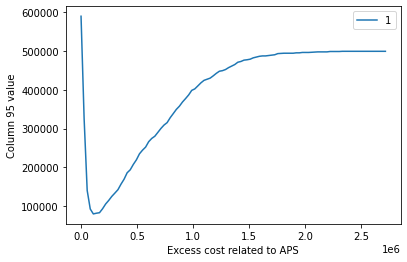

In [280]:
bv = (df['1'].max()+df['1'].min())/2
gap = np.abs(bv)
lc = 0
bestvalue = []
flag = 0
while(bv-gap != bv+gap):
    flag += 1
    for i in np.arange(bv-gap,bv+gap,(2*gap)/(100/flag**2)):
        temp=df['1'].copy()
        temp.values[:]=1
        temp[df[df['1']<i].index]=0
        cm = confusion_matrix(df['class'],temp)
        bestvalue.append((i,cm[0][1]*10+cm[1][0]*500))
    bestvaluedf = pd.DataFrame(bestvalue).set_index(0)
    bestvalue = []
    bv = float(bestvaluedf.idxmin().values)
    lc = float(bestvaluedf.min().values)
    gap = (np.abs(bv)*0.1)/flag**4
    if flag == 1:
        plt.figure(figsize=(15,5))
        bestvaluedf.plot()
        plt.xlabel('Excess cost related to APS')
        plt.ylabel('Column 95 value')   
    if ((bestvaluedf.max()/bestvaluedf.min()) < 1.001).values[0]:
        break
print('best value of column \'1\':',bv)
print('least cost:',lc);

In [125]:
bestvaluedf

,1
0,
9.221843e+06,74540
9.223645e+06,74540
9.225447e+06,74510
9.227249e+06,74500


In [618]:
bestvalue = []
for i in range(0,20000000,100000):
    temp=df['95'].copy()
    temp.values[:]=0
    temp[df[df['95']>i].index]=1
    cm = confusion_matrix(df['class'],temp)
    bestvalue.append((i,cm[0][1]*10+cm[1][0]*500))

In [619]:
bestvaluedf = pd.DataFrame(bestvalue).set_index(0)

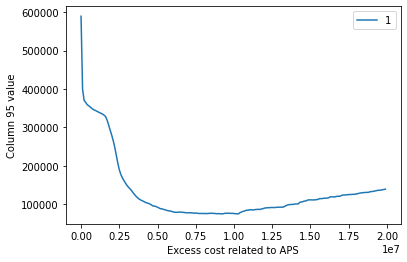

In [625]:
bestvaluedf.plot()
plt.xlabel('Excess cost related to APS')
plt.ylabel('Column 95 value');

In [621]:
bestvaluedf.sort_values(1).head()

,1
0,
9200000,74680
10200000,74890
10300000,75050
9100000,75080
8900000,75150


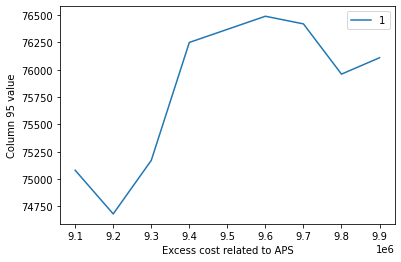

In [626]:
bestvaluedf[(bestvaluedf.index>9000000) & (bestvaluedf.index<10000000)].plot()
plt.xlabel('Excess cost related to APS')
plt.ylabel('Column 95 value');

In [627]:
bestvalue = []
for i in range(9150000,9250000,1000):
    temp=df['95'].copy()
    temp.values[:]=0
    temp[df[df['95']>i].index]=1
    cm = confusion_matrix(df['class'],temp)
    bestvalue.append((i,cm[0][1]*10+cm[1][0]*500))

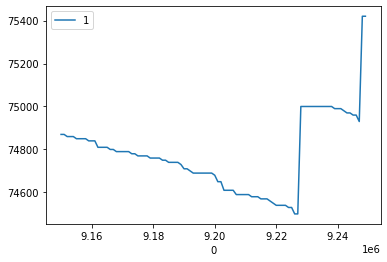

In [629]:
bestvaluedf = pd.DataFrame(bestvalue).set_index(0)
bestvaluedf.plot();

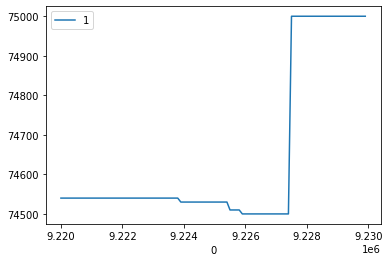

In [630]:
bestvalue = []
for i in range(9220000,9230000,100):
    temp=df['95'].copy()
    temp.values[:]=0
    temp[df[df['95']>i].index]=1
    cm = confusion_matrix(df['class'],temp)
    bestvalue.append((i,cm[0][1]*10+cm[1][0]*500))
    
bestvaluedf = pd.DataFrame(bestvalue).set_index(0)
bestvaluedf.plot();

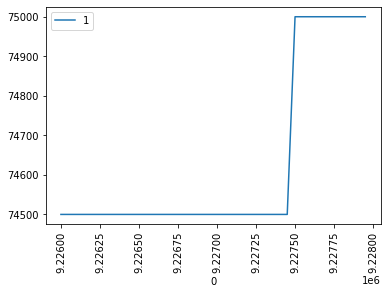

In [93]:
bestvalue = []
for i in range(9226000,9228000,50):
    temp=df['95'].copy()
    temp.values[:]=0
    temp[df[df['95']>i].index]=1
    cm = confusion_matrix(df['class'],temp)
    bestvalue.append((i,cm[0][1]*10+cm[1][0]*500))
    
bestvaluedf = pd.DataFrame(bestvalue).set_index(0)
bestvaluedf.plot()
plt.xticks(rotation=90);

In [96]:
bestvaluedf.idxmin()

1    9226000
dtype: int64

In [634]:
bestvaluedf.sort_values(1).head()

,1
0,
9226000,74500
9227450,74500
9227400,74500
9227350,74500
9227300,74500


In [644]:
temp=df['95'].copy()
temp.values[:]=0
temp[df[df['95']>9226000].index]=1
cm = confusion_matrix(df['class'],temp)
cm

array([[55700,  3300],
       [   83,   917]], dtype=int64)

In [645]:
cm[0][1]*10+cm[1][0]*500

74500

In [646]:
print(classification_report(df['class'],temp))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97     59000
           1       0.22      0.92      0.35      1000

    accuracy                           0.94     60000
   macro avg       0.61      0.93      0.66     60000
weighted avg       0.99      0.94      0.96     60000



In [126]:
df['95'].value_counts(dropna=False)

NaN           338
0.00          223
1692.48        10
1589.76         9
1580.16         9
             ... 
5513688.96      1
2508797.76      1
1544990.40      1
2809559.04      1
2036.16         1
Name: 95, Length: 45965, dtype: int64

In [219]:
nancount = df['class'][df['95'].isna()].value_counts()
idx = df['class'][df['95'].isna()].index

temp=df['95'].copy()
temp.values[:]=0
temp[df[df['95']>9220000].index]=1
cm = confusion_matrix(df['class'],temp)
#bestvalue.append((i,cm[0][1]*10+cm[1][0]*500))

In [227]:
temp=df['95'].copy()
temp.values[:]=1
temp[df[df['95']<9220000].index]=0
idx = df['class'][df['95'].isna()].index

In [228]:
if nancount[1]/nancount[0]>0.5:
    n=nancount[1]
else:
    n=int(len(idx)/2)
nanind = np.random.choice(idx,n)
#temp[nanind]=1
#temp[set(idx)-set(nanind)]=0
cm = confusion_matrix(df['class'],temp)
cm[0][1]*10+cm[1][0]*500

72820

In [216]:
temp.value_counts()

0.0    55638
1.0     4362
Name: 95, dtype: int64

In [181]:
df.isna().mean().sort_values()

class    0.000000
1        0.000000
81       0.002783
97       0.005633
96       0.005633
           ...   
113      0.772150
76       0.772217
77       0.795667
78       0.812033
79       0.821067
Length: 171, dtype: float64

In [182]:
df[['class','1','81']].corr()

,class,1,81
class,1.000000,0.536978,0.537452
1,0.536978,1.000000,1.000000
81,0.537452,1.000000,1.000000


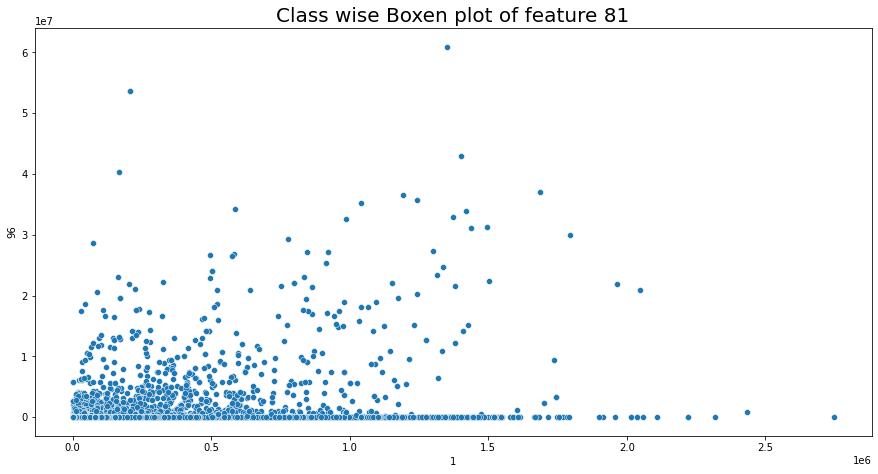

In [187]:
plt.figure(figsize=(15,7.5))
sns.scatterplot(y='96',x='1',data=df)
plt.title('Class wise Boxen plot of feature 81',fontsize=20);

In [188]:
imp = IterativeImputer(n_nearest_features = 50, initial_strategy='median',random_state=42)

In [189]:
impdf = imp.fit_transform(df)

c:\users\hari\anaconda3\lib\site-packages\sklearn\impute\_iterative.py:670: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)


In [194]:
idf = pd.DataFrame(impdf,columns=df.columns)

In [197]:
idf.to_csv('Imputed Trucks Data.csv')

In [199]:
idf.corr()['class'][1:].sort_values(ascending=False)

95     0.552282
112    0.537765
82     0.537765
83     0.537678
1      0.536978
         ...   
170   -0.023990
140   -0.058267
3     -0.059490
143   -0.102998
90          NaN
Name: class, Length: 170, dtype: float64

0        1209600.0
1        1209600.0
2        1209600.0
3        1209600.0
4        1209600.0
           ...    
59995    1209600.0
59996    1209600.0
59997    1209600.0
59998    1209600.0
59999    1209600.0
Name: 90, Length: 60000, dtype: float64

In [31]:
df[df['class']=='neg']['bm_000'].value_counts(dropna=False)

NaN          39478
1310700.0     3176
0.0           1214
193240.0        13
198100.0         9
             ...  
341020.0         1
432440.0         1
241960.0         1
215500.0         1
319600.0         1
Name: bm_000, Length: 8538, dtype: int64

In [35]:
df[df['class']=='pos']['br_000'].value_counts(dropna=False)

NaN          90
1310700.0    18
292360.0      7
229360.0      5
468760.0      4
             ..
283980.0      1
283100.0      1
318280.0      1
250940.0      1
240640.0      1
Name: br_000, Length: 776, dtype: int64

In [12]:
df.loc[:, df.nunique() < 40]

,class,ab_000,as_000,cd_000,ch_000,ef_000
0,neg,NaN,0.0,1209600.0,0.0,0.0
1,neg,NaN,0.0,1209600.0,NaN,0.0
2,neg,NaN,0.0,1209600.0,0.0,0.0
3,neg,0.0,0.0,1209600.0,0.0,4.0
4,neg,NaN,0.0,1209600.0,0.0,0.0
...,...,...,...,...,...,...
59995,neg,NaN,0.0,1209600.0,0.0,0.0
59996,neg,NaN,0.0,1209600.0,0.0,0.0
59997,neg,0.0,0.0,1209600.0,0.0,0.0
59998,neg,NaN,0.0,1209600.0,0.0,0.0


In [13]:
df['ab_000'].value_counts(dropna=False)

NaN      46329
0.0      10977
2.0       1937
4.0        420
6.0        148
8.0         65
10.0        35
12.0        28
14.0        12
16.0         7
24.0         6
18.0         5
26.0         4
20.0         3
34.0         3
22.0         3
100.0        3
58.0         2
28.0         2
52.0         1
90.0         1
30.0         1
32.0         1
48.0         1
134.0        1
36.0         1
68.0         1
204.0        1
44.0         1
46.0         1
Name: ab_000, dtype: int64

KeyboardInterrupt: 

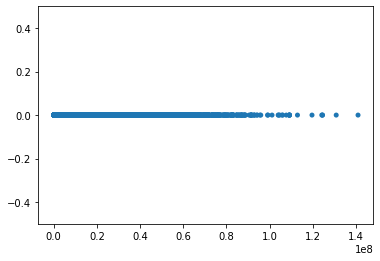

In [59]:
sns.swarmplot(x='ci_000',data=df,hue='class')

In [55]:
df['cd_000'].value_counts(dropna=False)

1209600.0    59324
NaN            676
Name: cd_000, dtype: int64

In [16]:
df[df['cd_000']!=1209600.0]['class'].value_counts()

neg    633
pos     43
Name: class, dtype: int64

In [6]:
df.drop('cd_000',axis=1,inplace=True)

In [56]:
df['ch_000'].value_counts(dropna=False)

0.0    45129
NaN    14861
2.0       10
Name: ch_000, dtype: int64

In [21]:
df[df['ch_000']==2.0]['class'].value_counts()

neg    9
pos    1
Name: class, dtype: int64

In [7]:
df.drop('ch_000',axis=1,inplace=True)

In [62]:
df.describe()

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
count,6.000000e+04,13671.000000,5.666500e+04,4.513900e+04,57500.000000,57500.000000,5.932900e+04,5.932900e+04,5.932900e+04,5.932900e+04,...,5.932900e+04,5.932900e+04,5.932900e+04,5.932900e+04,5.932900e+04,5.932900e+04,5.932900e+04,5.932900e+04,57276.000000,57277.000000
mean,5.933650e+04,0.713189,3.560143e+08,1.906206e+05,6.819130,11.006817,2.216364e+02,9.757223e+02,8.606015e+03,8.859128e+04,...,4.454897e+05,2.111264e+05,4.457343e+05,3.939462e+05,3.330582e+05,3.462714e+05,1.387300e+05,8.388915e+03,0.090579,0.212756
std,1.454301e+05,3.478962,7.948749e+08,4.040441e+07,161.543373,209.792592,2.047846e+04,3.420053e+04,1.503220e+05,7.617312e+05,...,1.155540e+06,5.433188e+05,1.168314e+06,1.121044e+06,1.069160e+06,1.728056e+06,4.495100e+05,4.747043e+04,4.368855,8.830641
min,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,8.340000e+02,0.000000,1.600000e+01,2.400000e+01,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.936000e+03,1.166000e+03,2.700000e+03,3.584000e+03,5.120000e+02,1.100000e+02,0.000000e+00,0.000000e+00,0.000000,0.000000
50%,3.077600e+04,0.000000,1.520000e+02,1.260000e+02,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.337960e+05,1.120860e+05,2.215180e+05,1.899880e+05,9.243200e+04,4.109800e+04,3.812000e+03,0.000000e+00,0.000000,0.000000
75%,4.866800e+04,0.000000,9.640000e+02,4.300000e+02,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,4.383960e+05,2.182320e+05,4.666140e+05,4.032220e+05,2.750940e+05,1.678140e+05,1.397240e+05,2.028000e+03,0.000000,0.000000
max,2.746564e+06,204.000000,2.130707e+09,8.584298e+09,21050.000000,20070.000000,3.376892e+06,4.109372e+06,1.055286e+07,6.340207e+07,...,7.793393e+07,3.775839e+07,9.715238e+07,5.743524e+07,3.160781e+07,1.195801e+08,1.926740e+07,3.810078e+06,482.000000,1146.000000


In [14]:
df.nunique().sort_values()[:20]

cd_000      1
class       2
ch_000      2
as_000     21
ef_000     28
ab_000     29
dz_000     47
eg_000     49
cs_009     53
au_000     56
ar_000     68
dj_000     72
cr_000     74
ea_000    134
db_000    146
ag_000    154
ak_000    159
dl_000    181
dm_000    221
dk_000    256
dtype: int64

In [46]:
df.fillna(df.median()).corr()['aa_000'].abs().sort_values(ascending=False)

aa_000    1.000000
bt_000    0.998774
ci_000    0.962910
ao_000    0.910950
bb_000    0.905625
            ...   
dj_000    0.002514
cf_000    0.001591
ad_000    0.001590
co_000    0.001586
cd_000         NaN
Name: aa_000, Length: 170, dtype: float64

<AxesSubplot:xlabel='am_0', ylabel='al_000'>

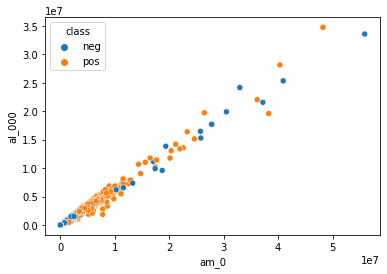

In [51]:
sns.scatterplot(x='am_0',y='al_000',data=df,hue='class')

In [31]:
df['as_000'].value_counts(dropna=False)

0.0          59350
NaN            629
13752.0          2
357260.0         1
4.0              1
1156.0           1
368184.0         1
6268.0           1
201306.0         1
790.0            1
31518.0          1
489122.0         1
63712.0          1
693990.0         1
21748.0          1
1655240.0        1
128844.0         1
320346.0         1
1150508.0        1
647060.0         1
113724.0         1
1246190.0        1
Name: as_000, dtype: int64

In [32]:
df[df['as_000']==0.0]['class'].value_counts()

neg    58398
pos      952
Name: class, dtype: int64

In [8]:
df.drop('as_000',axis=1,inplace=True)

In [34]:
df['ef_000'].value_counts(dropna=False)

0.0      57021
NaN       2724
2.0        132
4.0         52
6.0         13
8.0         11
84.0         6
10.0         6
12.0         6
20.0         3
18.0         2
144.0        2
22.0         2
350.0        2
26.0         2
166.0        2
14.0         2
30.0         1
320.0        1
134.0        1
362.0        1
236.0        1
276.0        1
82.0         1
86.0         1
482.0        1
252.0        1
40.0         1
74.0         1
Name: ef_000, dtype: int64

In [39]:
df[df['ef_000'].isna()]['class'].value_counts(dropna=False)

neg    2347
pos     377
Name: class, dtype: int64

In [9]:
df.drop('ef_000',axis=1,inplace=True)

In [53]:
df.loc[:, df.isna().sum()>0.7*len(df)]

,ab_000,bn_000,bo_000,bp_000,bq_000,br_000,cr_000
0,NaN,305200.0,283680.0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,NaN,NaN,NaN,NaN,NaN,0.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
59995,NaN,245580.0,152420.0,212500.0,151980.0,199220.0,NaN
59996,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59997,0.0,NaN,NaN,NaN,NaN,NaN,0.0
59998,NaN,282140.0,362360.0,NaN,NaN,NaN,NaN


In [10]:
df.drop(df.loc[:, df.isna().sum()>0.7*len(df)].columns,axis=1,inplace=True)   

In [19]:
df.loc[:, df.isna().sum()>0.25*len(df)]

,bk_000,bl_000,bm_000
0,330760.0,353400.0,299160.0
1,341420.0,359780.0,366560.0
2,137160.0,130640.0,NaN
3,NaN,NaN,NaN
4,306780.0,282560.0,274180.0
...,...,...,...
59995,263320.0,221620.0,221100.0
59996,NaN,NaN,NaN
59997,NaN,NaN,NaN
59998,302700.0,332300.0,308960.0


In [13]:
df[df['class']=='neg']['bm_000'].value_counts(dropna=False)

NaN          39478
1310700.0     3176
0.0           1214
193240.0        13
198100.0         9
             ...  
341020.0         1
432440.0         1
241960.0         1
215500.0         1
319600.0         1
Name: bm_000, Length: 8538, dtype: int64

In [67]:
df.head()

,class,aa_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,eg_000
0,neg,76698.0,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1706908.0,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0
1,neg,33058.0,0.000000e+00,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,824154.0,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0
2,neg,41040.0,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,0.0,...,453378.0,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0
3,neg,12.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,318.0,...,1566.0,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,32.0
4,neg,60874.0,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,0.0,...,904230.0,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0


<AxesSubplot:xlabel='class', ylabel='aa_000'>

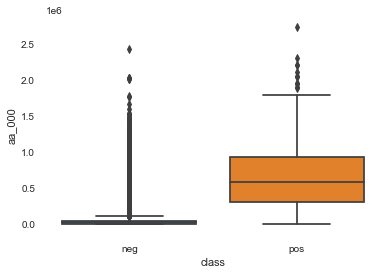

In [69]:
sns.boxplot(x='class',y='aa_000',data=df)

In [87]:
df[df['class']=='neg']['aa_000'].quantile(1)

2434708.0

In [ ]:
z = np.abs(stats.zscore(df[]))
np.where(z > 3)

In [16]:
df[df['class']=='neg']['bm_000'].mode()

0    1310700.0
dtype: float64

In [42]:
((df[df['class']=='neg'].isna().sum()/len(df[df['class']=='neg']))*100).sort_values(ascending=False)[:15]

bm_000    66.911864
bl_000    46.118644
bk_000    38.932203
co_000    24.094915
cf_000    24.094915
cg_000    24.094915
ad_000    24.094915
cu_000    22.501695
dc_000    22.501695
db_000    22.501695
da_000    22.501695
cz_000    22.501695
cy_000    22.501695
cx_000    22.501695
ct_000    22.501695
dtype: float64

In [46]:
((df[df['class']=='pos'].isna().sum()/len(df[df['class']=='pos']))*100).sort_values(ascending=False)[:50]

cg_000    64.5
co_000    64.5
ad_000    64.5
cf_000    64.5
cz_000    53.2
cy_000    53.2
cx_000    53.2
cv_000    53.2
dc_000    53.2
ct_000    53.2
cu_000    53.2
db_000    53.2
ak_000    53.2
da_000    53.2
ca_000    53.0
dg_000    52.4
df_000    52.4
dh_000    52.4
dm_000    52.4
dl_000    52.4
dk_000    52.4
dj_000    52.4
di_000    52.4
eb_000    52.4
ac_000    46.2
de_000    37.7
cp_000    37.7
bd_000    37.7
bc_000    37.7
ar_000    37.7
eg_000    37.7
bz_000    37.7
du_000    37.7
ea_000    37.7
dp_000    37.7
dq_000    37.7
do_000    37.7
dr_000    37.7
ds_000    37.7
dt_000    37.7
dv_000    37.7
dx_000    37.7
dy_000    37.7
dz_000    37.7
be_000    34.1
af_000    34.1
av_000    34.1
bf_000    34.1
ce_000    34.1
ax_000    34.1
dtype: float64

In [51]:
df[df['class']=='pos']['cg_000'].value_counts(dropna=False)

NaN       645
0.0        30
82.0        5
18.0        4
36.0        4
         ... 
1724.0      1
1292.0      1
1604.0      1
534.0       1
712.0       1
Name: cg_000, Length: 230, dtype: int64

In [62]:
df[df['class']=='pos']['cg_000'].median()

306.0

In [61]:
df[df['class']=='pos']['cg_000'],4)

9                     NaN
23                    NaN
60       (875.0, 14184.0]
115                   NaN
135                   NaN
               ...       
59484                 NaN
59601                 NaN
59692                 NaN
59742                 NaN
59769    (875.0, 14184.0]
Name: cg_000, Length: 1000, dtype: category
Categories (4, interval[float64]): [(-0.001, 72.0] < (72.0, 306.0] < (306.0, 875.0] < (875.0, 14184.0]]

In [75]:
df.loc[df['class']=='pos',:] = df.loc[df['class']=='pos',:].fillna(df.loc[df['class']=='pos',:].median())

In [76]:
df.loc[df['class']=='pos',:].isna().sum()

class     0
aa_000    0
ac_000    0
ad_000    0
ae_000    0
         ..
ee_006    0
ee_007    0
ee_008    0
ee_009    0
eg_000    0
Length: 160, dtype: int64

In [77]:
df.loc[df['class']=='neg',:] = df.loc[df['class']=='neg',:].fillna(df.loc[df['class']=='neg',:].median())

In [78]:
df.isna().sum()

class     0
aa_000    0
ac_000    0
ad_000    0
ae_000    0
         ..
ee_006    0
ee_007    0
ee_008    0
ee_009    0
eg_000    0
Length: 160, dtype: int64

In [84]:
df['class'] = df['class'].astype('category')

In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Columns: 160 entries, class to eg_000
dtypes: category(1), float64(159)
memory usage: 72.8 MB


In [91]:
df.head()

,class,aa_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,eg_000
0,neg,76698.0,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1706908.0,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0
1,neg,33058.0,0.000000e+00,124.0,0.0,0.0,0.0,0.0,0.0,0.0,...,824154.0,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0
2,neg,41040.0,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,0.0,...,453378.0,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0
3,neg,12.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,318.0,...,1566.0,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,32.0
4,neg,60874.0,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,0.0,...,904230.0,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0


In [90]:
df.to_csv('TrucksTrainMedian.csv')

In [100]:
pop = df.loc[df['class']=='pos','bx_000']

In [108]:
pop.sample(1000,replace=True).describe()

count    1.000000e+03
mean     4.385621e+07
std      3.166090e+07
min      2.060000e+02
25%      1.741039e+07
50%      4.055896e+07
75%      6.317339e+07
max      1.627935e+08
Name: bx_000, dtype: float64

In [113]:
pd.qcut(df[df['class']=='pos'].index,4)

[(8.999, 12945.5], (8.999, 12945.5], (8.999, 12945.5], (8.999, 12945.5], (8.999, 12945.5], ..., (43335.75, 59769.0], (43335.75, 59769.0], (43335.75, 59769.0], (43335.75, 59769.0], (43335.75, 59769.0]]
Length: 1000
Categories (4, interval[float64]): [(8.999, 12945.5] < (12945.5, 27411.0] < (27411.0, 43335.75] < (43335.75, 59769.0]]

In [117]:
df[0::10]['class'].value_counts()['neg']

neg    5920
pos      80
Name: class, dtype: int64

In [125]:
cost = []
for i in range(1,60001):
    x = df[0::i]['class'].value_counts()
    cost.append((i,x['neg']*10 + (1000-x['pos'])*500))

In [128]:
pd.DataFrame(cost).sort_values(1)

,0,1
43,44,495280
21,22,495660
65,66,497370
707,708,497790
435,436,497810
...,...,...
9,10,519200
2,3,527110
4,5,529730
1,2,557240


In [133]:
df['cat'] = (df['class']=='neg').astype('int')

In [138]:
corr = df.corr()['cat']

In [142]:
corr.sort_values()

ci_000   -0.554937
bb_000   -0.549628
bv_000   -0.548656
bu_000   -0.548656
cq_000   -0.548656
            ...   
da_000    0.002974
dl_000    0.003224
db_000    0.016747
ac_000    0.050996
cat       1.000000
Name: cat, Length: 160, dtype: float64

<AxesSubplot:xlabel='bb_000', ylabel='bv_000'>

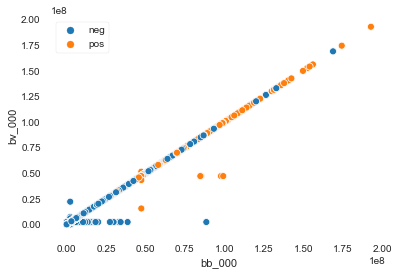

In [117]:
sns.scatterplot(x='bb_000',y='bv_000',hue=df['class'].tolist(),data=df)

In [196]:
df[df['class']=='neg']['ci_000'].quantile(0.999)/100000

695.0621556480085

In [199]:
df[df['class']=='pos']['ci_000'].quantile(.89)/100000

695.462779488

In [69]:
df.sample(frac=np.random.random(),replace=True)['class'].value_counts()

neg    34759
pos      570
Name: class, dtype: int64

In [91]:
z = (df['class']=='neg').map({True:2,False:1})

In [ ]:
perm = pd.DataFrame()

In [96]:

for _ in range(100):
    best_ = pd.DataFrame()
    sample = df.sample(frac=1,replace=True)
    for i in np.arange(0.03,0.1,0.01):
        temp = sample[sample['class']=='pos']['ci_000'].quantile(i)
        y = sample[sample['ci_000']>temp]['class'].value_counts()
        best_[i] = y.values

    best_=best_.T
    best_.columns = ['neg','pos']
    best_['cost'] = best_['neg']*10 + (sample['class'].value_counts()['pos']-best_['pos'])*500
    best_.sort_values('cost',inplace=True)
    best_ = best_.iloc[0,:]
    perm = perm.append(best_)

In [93]:
df.sample(frac=1,replace=True)['class'].value_counts()

neg    58969
pos     1031
Name: class, dtype: int64

<AxesSubplot:>

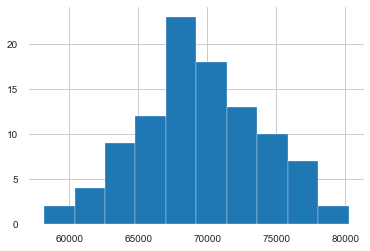

In [97]:
perm['cost'].hist()

In [100]:
perm['cost'].quantile([0.025,0.975])

0.025    61378.75
0.975    77566.25
Name: cost, dtype: float64

In [103]:
perm.index

Float64Index([0.06, 0.07, 0.08, 0.08, 0.03, 0.06, 0.07, 0.08, 0.08, 0.08, 0.06,
              0.03, 0.08, 0.07, 0.05, 0.07, 0.05, 0.08, 0.07, 0.09, 0.09, 0.05,
              0.06, 0.08, 0.07, 0.09, 0.07, 0.07, 0.08, 0.07, 0.06, 0.08, 0.08,
              0.08, 0.07, 0.09, 0.06, 0.06, 0.07, 0.06, 0.06, 0.07, 0.04, 0.05,
              0.08, 0.09, 0.07, 0.08, 0.07, 0.07, 0.07, 0.06, 0.05, 0.06, 0.07,
              0.08, 0.06, 0.08, 0.05, 0.08, 0.06, 0.07, 0.06, 0.06, 0.07, 0.07,
              0.07, 0.09, 0.07, 0.07, 0.07, 0.08, 0.09, 0.07, 0.07, 0.06, 0.06,
              0.07, 0.09, 0.07, 0.07, 0.06, 0.05, 0.07, 0.06, 0.07, 0.08, 0.06,
              0.08, 0.07, 0.08, 0.08, 0.06, 0.07, 0.08, 0.09, 0.07, 0.06, 0.07,
              0.07],
             dtype='float64')

In [292]:
best_ = pd.DataFrame()
for i in np.arange(0,0.3,0.01):
    temp = df[df['class']=='pos']['ci_000'].quantile(i)
    y = df[df['ci_000']>temp]['class'].value_counts()
    best_[i] = y.values

In [294]:
best_=best_.T

In [296]:
best_.columns = ['neg','pos']

In [297]:
#best_ = best_.reset_index()
best_.head()

,neg,pos
0.01,25948,990
0.02,9844,980
0.03,7408,970
0.04,5382,960
0.05,4812,950


In [303]:
best_['cost'] = best_['neg']*10 + (1000-best_['pos'])*500

In [311]:
best_.sort_values('cost').head()

,neg,pos,cost
0.07,3545,930,70450
0.08,3119,920,71190
0.06,4170,940,71700
0.09,2793,910,72930
0.05,4812,950,73120


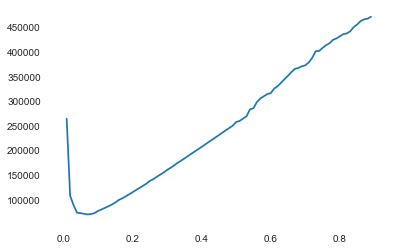

In [310]:
plt.plot(best_.cost)

In [312]:
df[df['class']=='pos']['ci_000'].quantile(.07)

8772464.620800002

In [321]:
(df[df['class']=='neg']['ci_000']>8772464.620800002).value_counts(normalize=True)

False    0.939915
True     0.060085
Name: ci_000, dtype: float64

In [323]:
(df[df['class']=='pos']['ci_000']>8772464.620800002).value_counts(normalize=True)

True     0.93
False    0.07
Name: ci_000, dtype: float64

In [50]:
df_test = pd.read_csv('C:\\Users\\Hari\\Downloads\\aps_failure_test_set.csv',skiprows=20)
df_test.replace('na',np.nan,inplace=True)
df_test.loc[:,'aa_000':'eg_000'] = df_test.loc[:,'aa_000':'eg_000'].astype(float)
df_test.drop('ch_000',axis=1,inplace=True)
df_test.drop('as_000',axis=1,inplace=True)
df_test.drop('ef_000',axis=1,inplace=True)
df_test.drop(df_test.loc[:, df_test.isna().sum()>0.7*len(df_test)].columns,axis=1,inplace=True)   
df_test.loc[df_test['class']=='pos',:] = df_test.loc[df_test['class']=='pos',:].fillna(df_test.loc[df_test['class']=='pos',:].median())
df_test.loc[df_test['class']=='neg',:] = df_test.loc[df_test['class']=='neg',:].fillna(df_test.loc[df_test['class']=='neg',:].median())
df_test['class'] = df_test['class'].astype('category')
df_test['cat'] = (df_test['class']=='neg').astype('int')
first = [df_test.columns[0],df_test.columns[-1]]
last = df_test.columns[1:-1].to_list()
first.extend(last)
df_test = df_test[first]

In [51]:
df_test.to_pickle('TrucksTestMedian.pickle')

In [4]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16000 entries, 0 to 15999
Columns: 162 entries, class to cat
dtypes: category(1), float64(160), int32(1)
memory usage: 19.6 MB


In [333]:
(df_test[df_test['class']=='neg']['ci_000']>8772464.620800002).value_counts(normalize=True)

False    0.94272
True     0.05728
Name: ci_000, dtype: float64

In [334]:
(df_test[df_test['class']=='pos']['ci_000']>8772464.620800002).value_counts(normalize=True)

True     0.949333
False    0.050667
Name: ci_000, dtype: float64

In [351]:
best_ = pd.DataFrame()
for i in np.arange(0,1.01,0.01):
    temp = df[df['class']=='pos']['ci_000'].quantile(i)
    y = df[df['ci_000']>temp]['class'].value_counts()
    best_[i] = np.append(y.values,temp)
    
best_=best_.T
best_.columns = ['neg','pos','ci_000value']
best_['cost'] = best_['neg']*10 + (1000-best_['pos'])*500

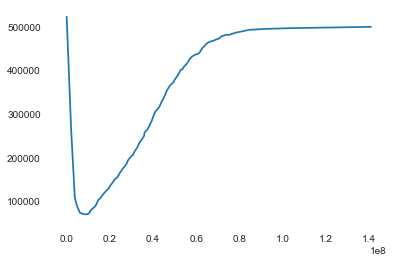

In [354]:
plt.plot(best_.ci_000value,best_.cost)

In [353]:
best_[best_['cost']==best_['cost'].min()]

,neg,pos,ci_000value,cost
0.07,3545.0,930.0,8.772465e+06,70450.0


In [47]:
df = pd.read_csv('C:\\Users\\Hari\\Downloads\\aps_failure_training_set.csv',skiprows=20)
df.replace('na',np.nan,inplace=True)
df.loc[:,'aa_000':'eg_000'] = df.loc[:,'aa_000':'eg_000'].astype(float)
df.drop('cd_000',axis=1,inplace=True)
df.drop('ch_000',axis=1,inplace=True)
df.drop('as_000',axis=1,inplace=True)
df.drop('ef_000',axis=1,inplace=True)
df.drop(df.loc[:, df.isna().sum()>0.7*len(df)].columns,axis=1,inplace=True)   
df.loc[df['class']=='pos',:] = df.loc[df['class']=='pos',:].fillna(df.loc[df['class']=='pos',:].median())
df.loc[df['class']=='neg',:] = df.loc[df['class']=='neg',:].fillna(df.loc[df['class']=='neg',:].median())
df['class'] = df['class'].astype('category')
df['cat'] = (df['class']=='neg').astype('int')
first = [df.columns[0],df.columns[-1]]
last = df.columns[1:-1].to_list()
first.extend(last)
df = df[first]

In [49]:
df.to_pickle('TrucksTrainMedian.pickle')